In [1]:
# THE BEST PROVED TO BE GAN-LIKED METHODS

# I couldnt use pretrained GANs because most of them trained for img blending were outdated, 
# so I tried simulating the processes that happen there in order to receive same result

In [2]:
from PIL import Image
import numpy as np
import cv2

import torch
import torch.nn as nn
from matplotlib import pyplot as plt

In [3]:
glasses_articles = [
    "110020220079_01.png", 
    "110020220086_01.png", 
    "110020234383_01.png", 
    "190605021125_01.png",
    "190605067703_01.png"
    ]

glasses_with_masks = []

for article in glasses_articles:
    
    new_glasses = np.array(Image.open(f"../frames_new/imgs/{article}").convert("RGB").resize((512, 512)))
    new_masks = np.array(Image.open(f"../frames_new/masks/{article}").convert("L").resize((512, 512))) / 255.0
    
    glasses_with_masks.append((new_glasses, new_masks))

bg_img = np.array(Image.open("../frames/facetest2.png").convert("RGB").resize((512, 512)))

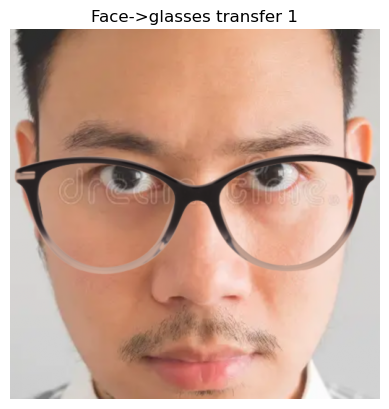

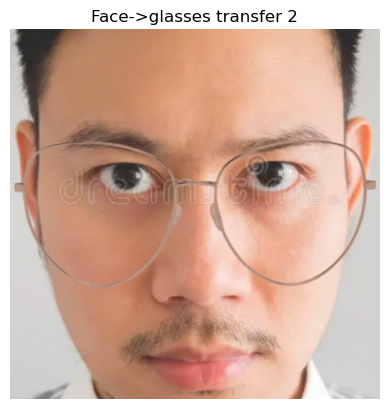

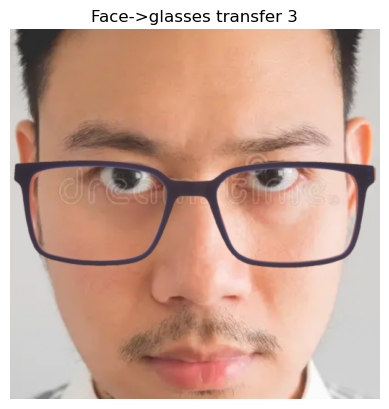

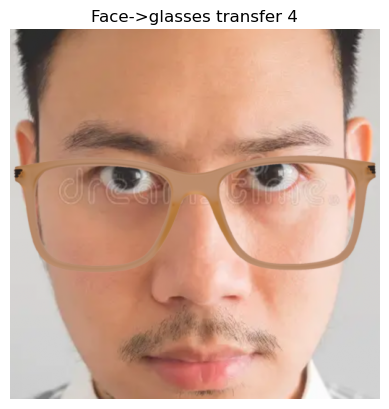

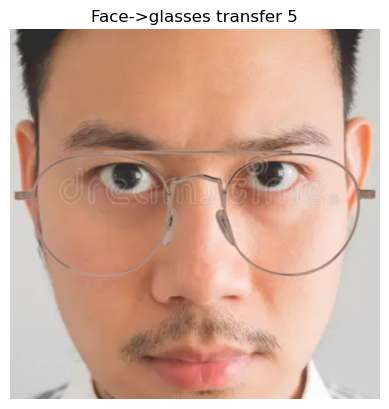

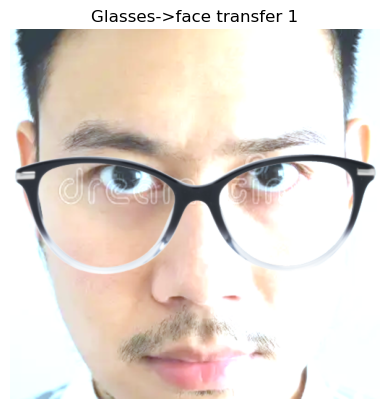

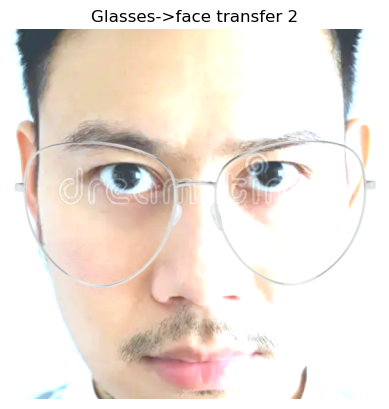

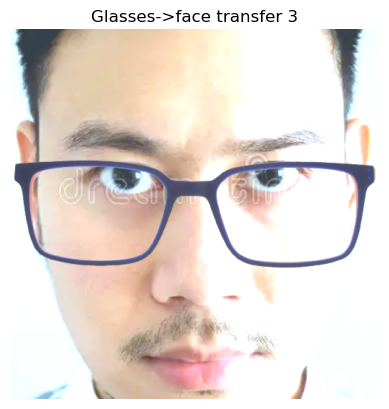

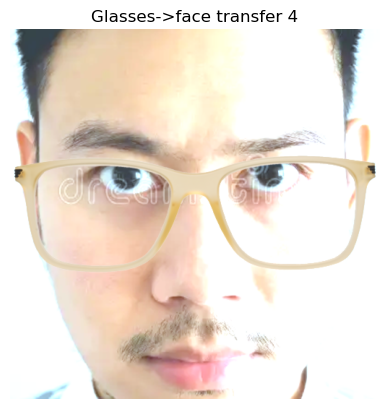

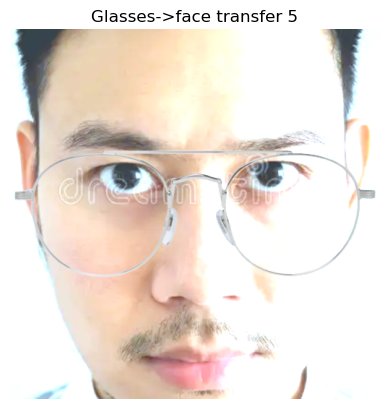

In [23]:
def cyclegan_harmonization(glasses, mask, face, inverted=False):
    """CycleGAN-inspired harmonization"""
    
    if inverted:  
        mask = 1 - mask
        glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    def gaussian_blur(image, kernel_size=5):
        """Apply Gaussian blur"""
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    
    mask_3d = np.stack([mask]*3, axis=2)
    
    # Color consistency cycle
    for cycle in range(3):
        # Forward: adjust glasses to match face
        glasses_adjusted = glasses.copy()
        for c in range(3):
            face_mean = np.mean(face[:, :, c])
            glasses_mean = np.mean(glasses[:, :, c])
            glasses_adjusted[:, :, c] = glasses[:, :, c] * (face_mean / (glasses_mean + 1e-8))
        
        # Backward: ensure consistency
        glasses = glasses_adjusted * 0.7 + glasses * 0.3
    
    result = face * (1 - mask_3d) + glasses * mask_3d
    result = gaussian_blur(result, 3) * 0.5 + result * 0.5
    result = np.clip(result, 0, 1)

    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cyclegan_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses transfer {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cyclegan_harmonization(glasses, mask, bg_img, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face transfer {i+1}")
plt.show()

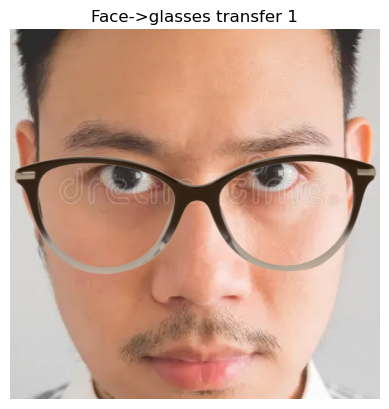

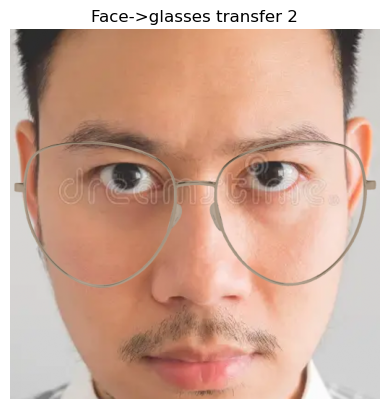

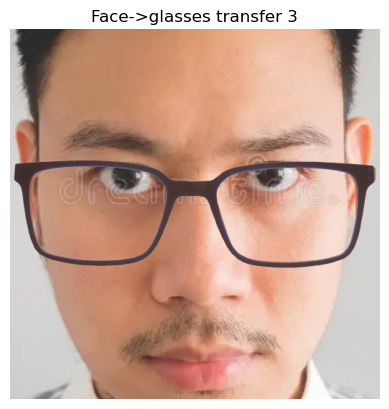

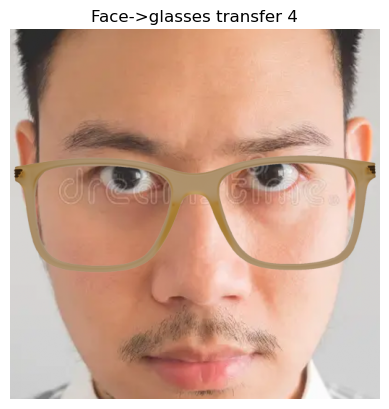

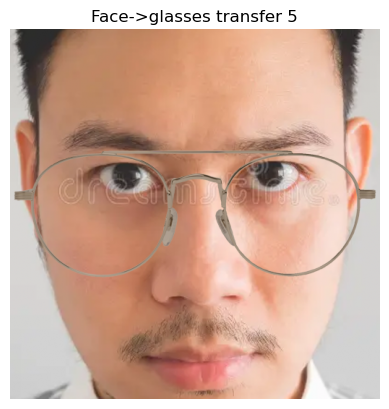

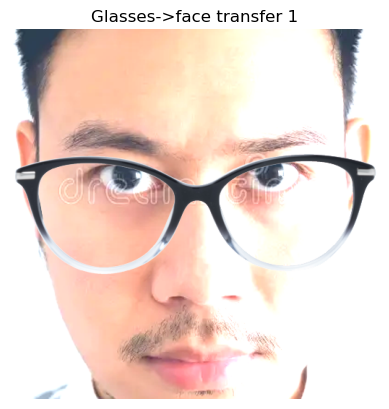

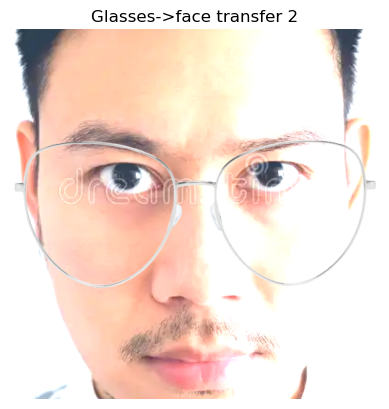

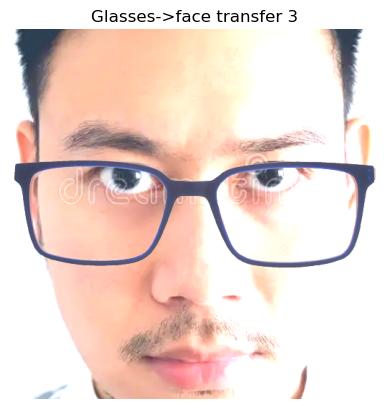

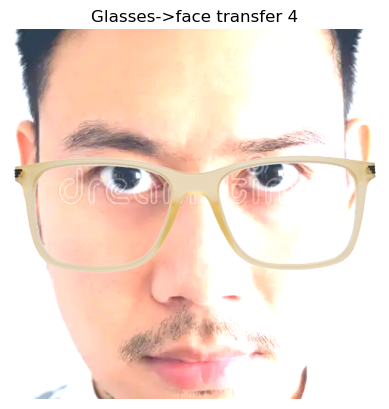

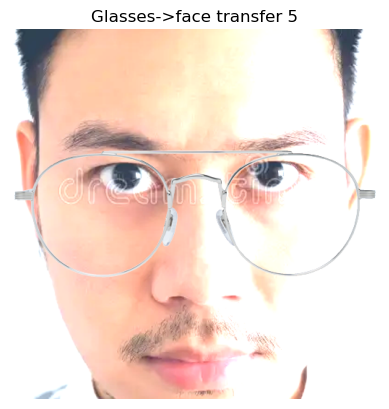

In [26]:
def stargan_harmonization(glasses, mask, face, inverted=False):
    """StarGAN-inspired harmonization - simplified"""
    
    if inverted:  
        mask = 1 - mask
        glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    # Domain adaptation
    face_brightness = np.mean(face)
    glasses_brightness = np.mean(glasses)
    
    # Brightness adaptation
    if glasses_brightness > face_brightness:
        glasses_adapted = glasses * (face_brightness / glasses_brightness)
    else:
        glasses_adapted = glasses * (face_brightness / glasses_brightness)
    
    # Color temperature adaptation
    face_temp = np.mean(face[:, :, 0]) - np.mean(face[:, :, 2])
    glasses_temp = np.mean(glasses[:, :, 0]) - np.mean(glasses[:, :, 2])
    
    if abs(face_temp - glasses_temp) > 0.1:
        temp_adjustment = (face_temp - glasses_temp) * 0.3
        glasses_adapted[:, :, 0] += temp_adjustment
        glasses_adapted[:, :, 2] -= temp_adjustment
    
    mask_3d = np.stack([mask]*3, axis=2)
    result = face * (1 - mask_3d) + glasses_adapted * mask_3d
    result = np.clip(result, 0, 1)
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stargan_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses transfer {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stargan_harmonization(glasses, mask, bg_img, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face transfer {i+1}")
plt.show()

  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright


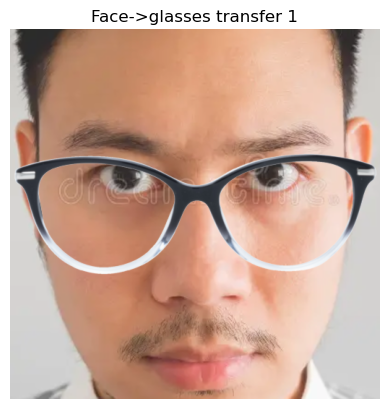

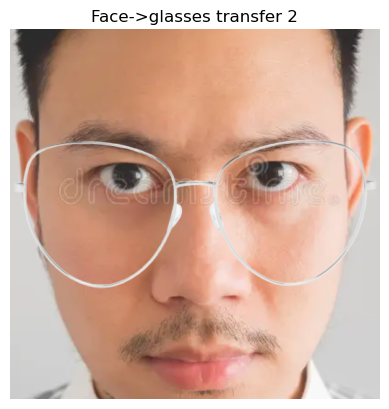

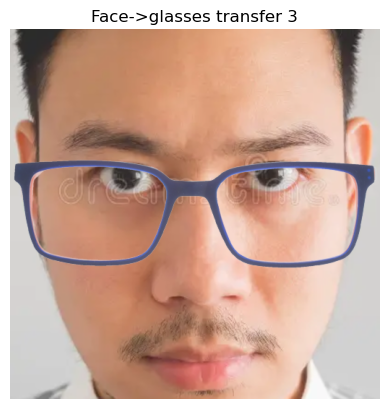

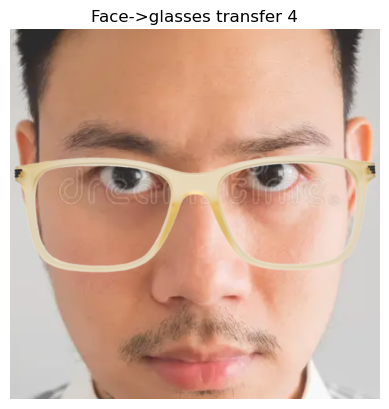

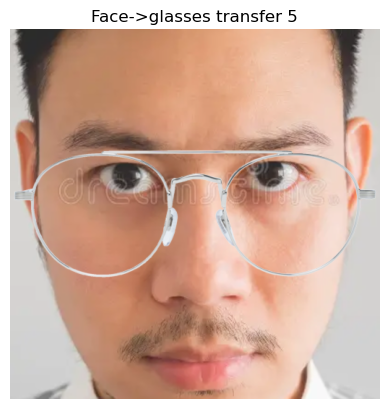

  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright
  Face domain: bright, Glasses domain: bright


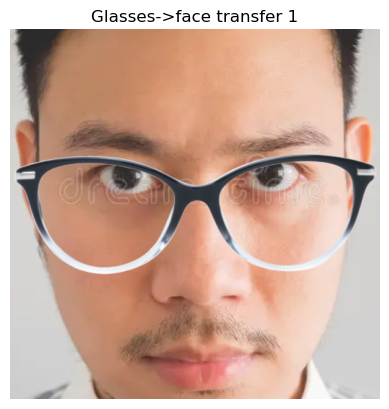

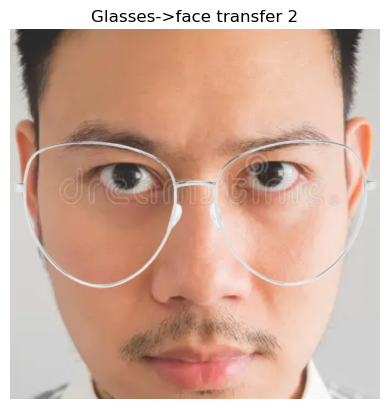

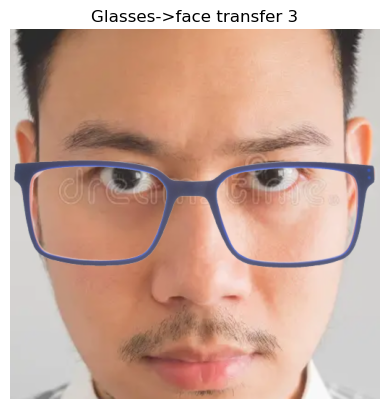

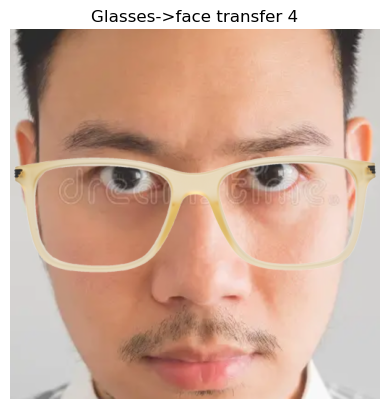

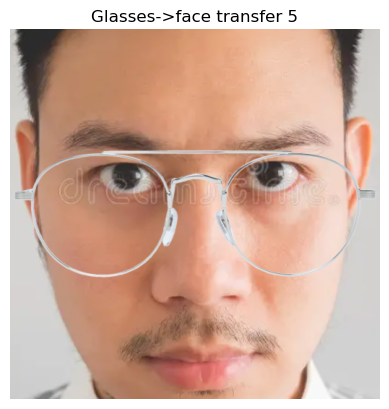

In [27]:
def stargan_multidomain_translation_harmonization(glasses, mask, face, inverted=False):
    """
    StarGAN-inspired harmonization using multi-domain translation
    Simulates StarGAN's unified multi-domain translation
    """
    
    if inverted:  
        mask = 1 - mask
        glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    def gaussian_blur(image, kernel_size=5):
        """Apply Gaussian blur"""
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    
    # Different domains (different lighting conditions)
    domains = {
        'bright': lambda x: np.clip(x * 1.2, 0, 1),
        'dark': lambda x: np.clip(x * 0.8, 0, 1),
        'warm': lambda x: np.clip(x * [1.1, 1.0, 0.9], 0, 1),
        'cool': lambda x: np.clip(x * [0.9, 1.0, 1.1], 0, 1)
    }
    
    # Domain classification (simplified)
    def classify_domain(image):
        brightness = np.mean(image)
        if brightness > 0.6:
            return 'bright'
        elif brightness < 0.4:
            return 'dark'
        else:
            warmth = np.mean(image[:, :, 0]) - np.mean(image[:, :, 2])
            return 'warm' if warmth > 0 else 'cool'
    
    # Get domains
    face_domain = classify_domain(face)
    glasses_domain = classify_domain(glasses)
    
    print(f"  Face domain: {face_domain}, Glasses domain: {glasses_domain}")
    
    # Multi-domain translation
    mask_3d = np.stack([mask]*3, axis=2)
    
    # Translate glasses to face domain
    if glasses_domain != face_domain:
        # Apply domain transformation
        domain_transform = domains[face_domain]
        glasses_transformed = domain_transform(glasses)
    else:
        glasses_transformed = glasses
    
    # Style consistency across domains
    def domain_consistent_blend(source, target, mask):
        # Ensure consistent style across domains
        blended = target * (1 - mask) + source * mask
        
        # Apply domain-specific post-processing
        if face_domain == 'bright':
            blended = gaussian_blur(blended, 3) * 0.3 + blended * 0.7
        elif face_domain == 'dark':
            blended = gaussian_blur(blended, 5) * 0.2 + blended * 0.8
        
        return blended
    
    result = domain_consistent_blend(glasses_transformed, face, mask_3d)
    
    # Multi-domain consistency loss
    for domain_name, domain_func in domains.items():
        domain_result = domain_func(result)
        consistency_loss = np.mean((domain_result - result) ** 2)
        
        # Apply small correction
        if consistency_loss > 0.01:
            result = result * 0.95 + domain_result * 0.05
    
    result = np.clip(result, 0, 1)
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stargan_multidomain_translation_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses transfer {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stargan_multidomain_translation_harmonization(glasses, mask, bg_img, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face transfer {i+1}")
plt.show()



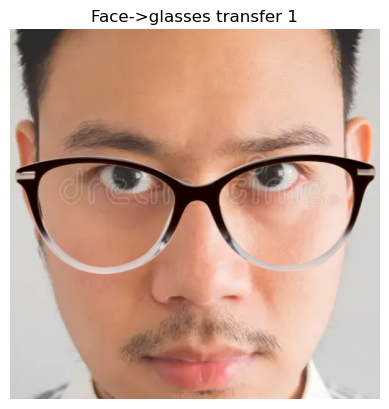

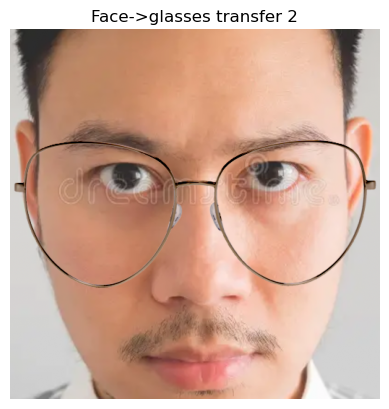

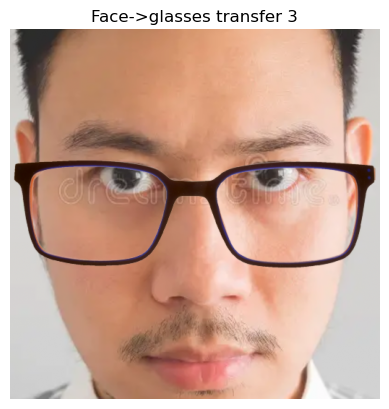

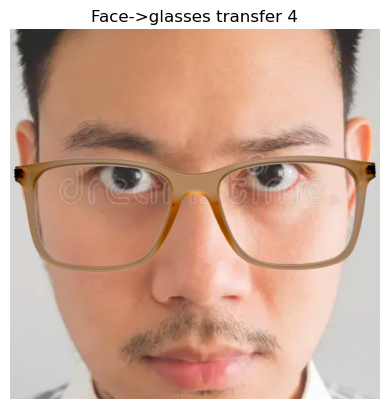

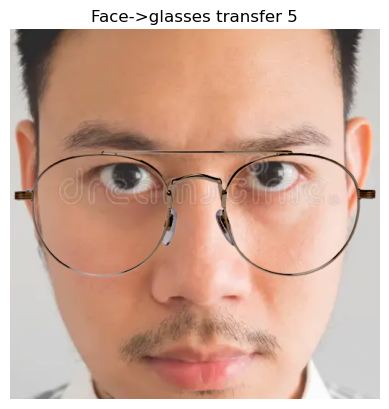

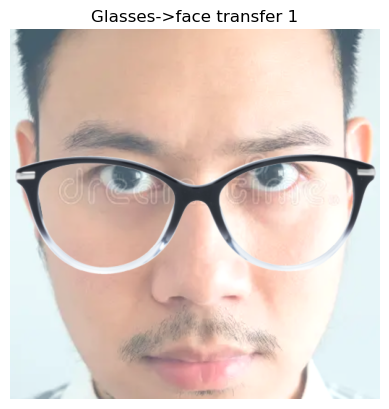

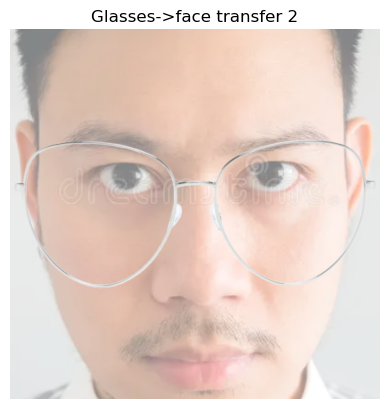

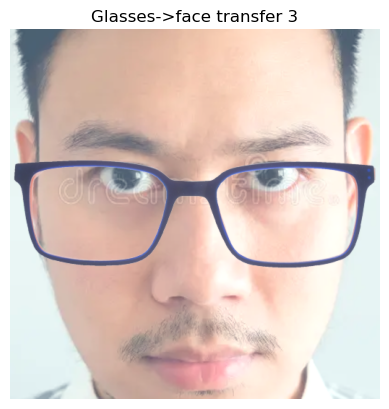

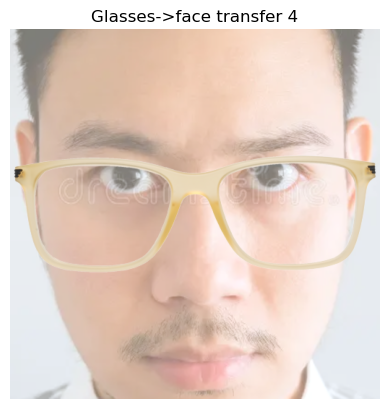

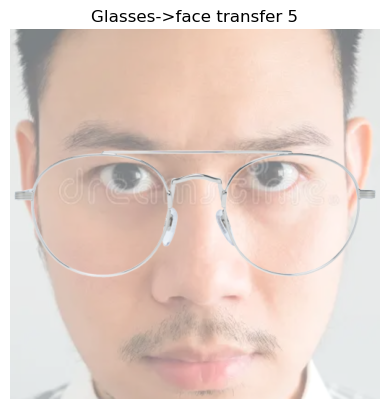

In [28]:
def stylegan_harmonization(glasses, mask, face, inverted=False):
    """
    StyleGAN-inspired harmonization using style transfer (from face to glasses)
    Follows StyleGAN's style injection and mixing
    """
    
    def gaussian_blur(image, kernel_size=5):
        """Apply Gaussian blur"""
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    
    # Extract style features (as in StyleGAN)
    def extract_style_features(image):
        # Multi-scale style extraction
        styles = []
        for scale in [1, 2, 4]:
            kernel_size = scale * 4 + 1
            blurred = gaussian_blur(image, kernel_size)
            
            # Compute style statistics
            mean = np.mean(blurred, axis=(0, 1))
            std = np.std(blurred, axis=(0, 1))
            styles.append((mean, std))
        return styles
    
    # Apply style transfer
    def apply_style(content, style_features):
        result = content.copy()
        
        for i, (style_mean, style_std) in enumerate(style_features):
            # Normalize content
            content_mean = np.mean(result, axis=(0, 1))
            content_std = np.std(result, axis=(0, 1))
            
            # Apply style
            normalized = (result - content_mean) / (content_std + 1e-8)
            styled = normalized * style_std + style_mean
            
            # Mix with original
            weight = 0.3 / (i + 1)
            result = result * (1 - weight) + styled * weight
        
        return result
    
    if inverted:  
        mask = 1 - mask
        glasses, face = face, glasses
    
    face = face / 255.0
    glasses = glasses / 255.0
    
    # Extract style from face
    face_style = extract_style_features(face)
    
    # Apply style transfer to glasses
    styled_glasses = apply_style(glasses, face_style)
    
    # Blend with original composition
    mask_3d = np.stack([mask]*3, axis=2)
    result = face * (1 - mask_3d) + styled_glasses * mask_3d
    
    # Additional style consistency
    result = gaussian_blur(result, 3) * 0.3 + result * 0.7
    result = np.clip(result, 0, 1)
    
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stylegan_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses transfer {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = stylegan_harmonization(glasses, mask, bg_img, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face transfer {i+1}")
plt.show()

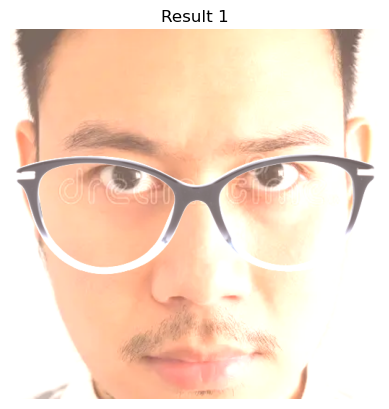

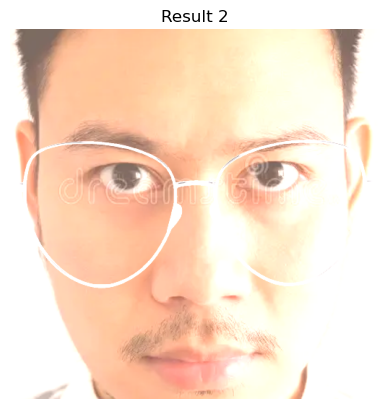

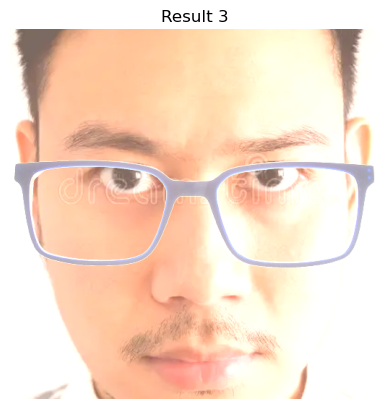

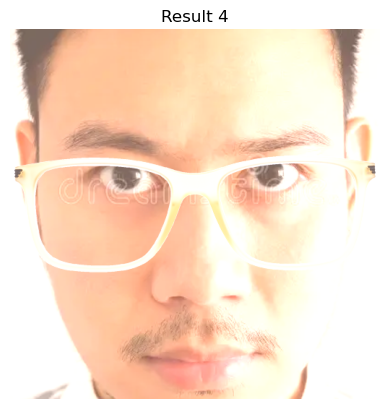

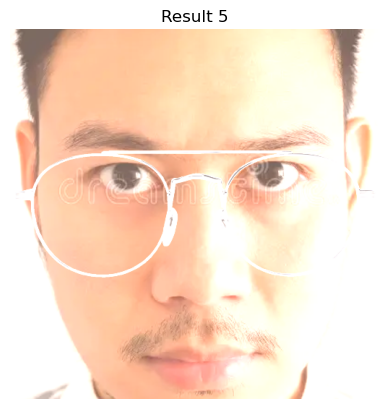

In [8]:
def cyclegan_bidirectional_translation_harmonisation(glasses, mask, face):
    """
    CycleGAN-inspired harmonization using cycle consistency
    Simulates bidirectional translation between domains
    """
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    # Forward translation: glasses domain -> face domain
    def translate_to_face_domain(glasses_region, face_context):
        # Color transfer
        for c in range(3):
            face_mean = np.mean(face_context[:, :, c])
            face_std = np.std(face_context[:, :, c])
            
            glasses_mean = np.mean(glasses_region[:, :, c])
            glasses_std = np.std(glasses_region[:, :, c])
            
            # Normalize and transfer
            normalized = (glasses_region[:, :, c] - glasses_mean) / (glasses_std + 1e-8)
            transferred = normalized * face_std + face_mean
            glasses_region[:, :, c] = transferred
        
        return glasses_region
    
    # Backward translation: face domain -> glasses domain
    def translate_to_glasses_domain(face_region, glasses_context):
        # Apply inverse color transfer
        for c in range(3):
            glasses_mean = np.mean(glasses_context[:, :, c])
            glasses_std = np.std(glasses_context[:, :, c])
            
            face_mean = np.mean(face_region[:, :, c])
            face_std = np.std(face_region[:, :, c])
            
            # Normalize and transfer
            normalized = (face_region[:, :, c] - face_mean) / (face_std + 1e-8)
            transferred = normalized * glasses_std + glasses_mean
            face_region[:, :, c] = transferred
        
        return face_region
    
    # Extract regions
    mask_3d = np.stack([mask]*3, axis=2)
    glasses_region = glasses * mask_3d
    face_region = face * mask_3d
    
    # Cycle consistency optimization
    for cycle in range(5):
        # Forward translation
        translated_glasses = translate_to_face_domain(glasses_region.copy(), face)
        
        # Backward translation
        reconstructed_glasses = translate_to_glasses_domain(translated_glasses.copy(), glasses)
        
        # Cycle consistency loss
        cycle_loss = np.mean((reconstructed_glasses - glasses_region) ** 2)
        
        # Update with cycle consistency
        glasses_region = glasses_region * 0.9 + translated_glasses * 0.1
    
    # Final composition
    result = face * (1 - mask_3d) + glasses_region
    result = np.clip(result, 0, 1)

    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cyclegan_bidirectional_translation_harmonisation(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

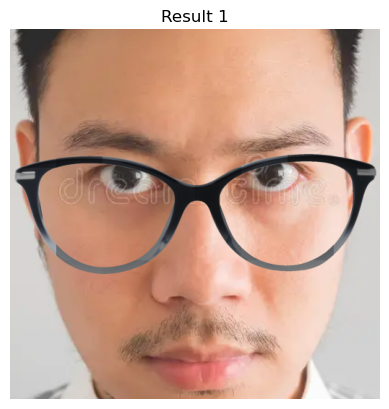

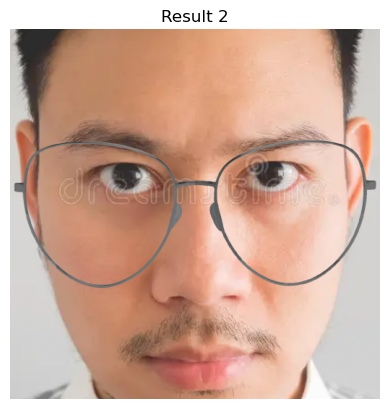

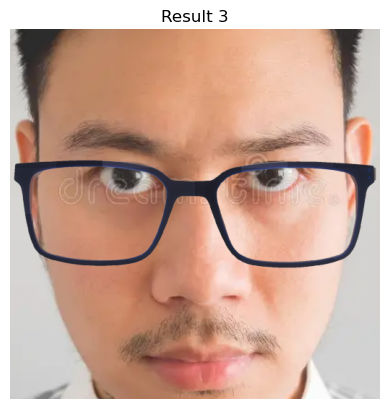

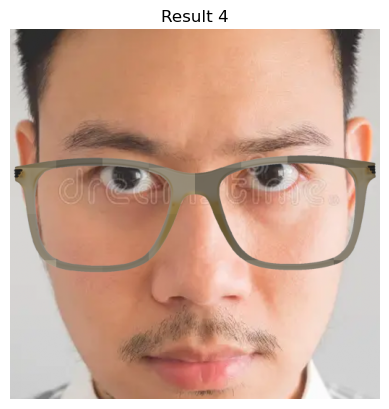

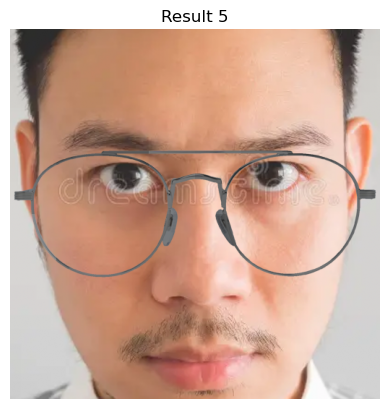

In [31]:
def patch_attention_harmonization(glasses, mask, face, patch_size=16):
    """
    Transformer-inspired patch harmonization
    Each patch “looks” at the corresponding face patch and decides how much to borrow its style.
    Instead of full self-attention across all patches, this uses a simpler correlation-based “cross-attention” for efficiency.
    """
    
    glasses = glasses / 255.0
    face = face / 255.0

    h, w = glasses.shape[:2]
    
    def patchify(image):
        patches = []
        for i in range(0, h, patch_size):
            for j in range(0, w, patch_size):
                patch = image[i:i+patch_size, j:j+patch_size]
                patches.append(patch)
        return patches
    
    def unpatchify(patches):
        result = np.zeros_like(glasses)
        idx = 0
        for i in range(0, h, patch_size):
            for j in range(0, w, patch_size):
                if idx < len(patches):
                    result[i:i+patch_size, j:j+patch_size] = patches[idx]
                    idx += 1
        return result
    
    # Extract patches
    glasses_patches = patchify(glasses)
    face_patches = patchify(face)
    mask_patches = patchify(mask)
    
    # Apply attention
    harmonized_patches = []
    for g_patch, f_patch, m_patch in zip(glasses_patches, face_patches, mask_patches):
        if g_patch.size > 0 and f_patch.size > 0:
            similarity = np.corrcoef(g_patch.flatten(), f_patch.flatten())[0, 1]
            if np.isnan(similarity):
                similarity = 0
            
            attention_weight = (similarity + 1) / 2
            m_patch_3d = np.stack([m_patch]*3, axis=2) if len(m_patch.shape) == 2 else m_patch
            harmonized_patch = f_patch * (1 - m_patch_3d) + g_patch * m_patch_3d * attention_weight
            harmonized_patches.append(harmonized_patch)
        else:
            harmonized_patches.append(f_patch)
    
    # patches -> full imahe
    result = unpatchify(harmonized_patches)
    return np.clip(result, 0, 1)

# patch size = 2, 8, 16, 32, 64, 128 - the smaller size the longer computation and deeper transformation
for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = patch_attention_harmonization(glasses, mask, bg_img, 64)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

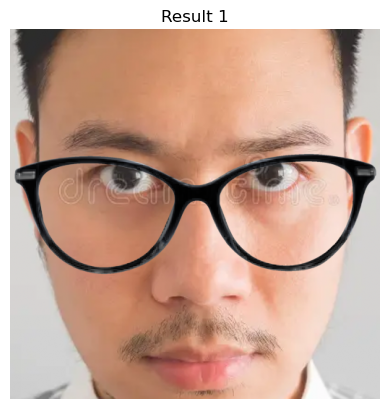

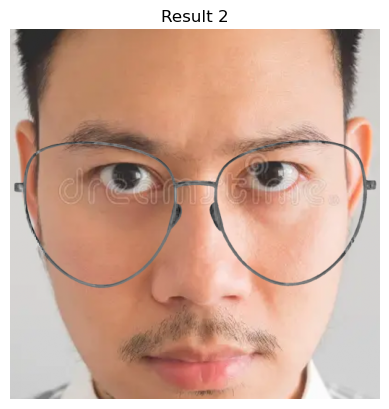

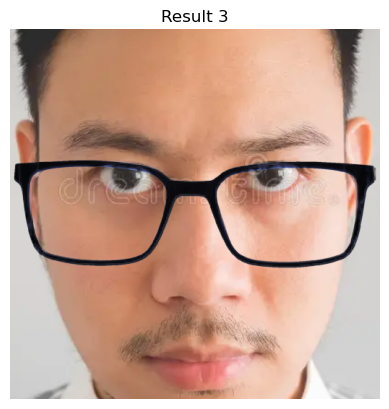

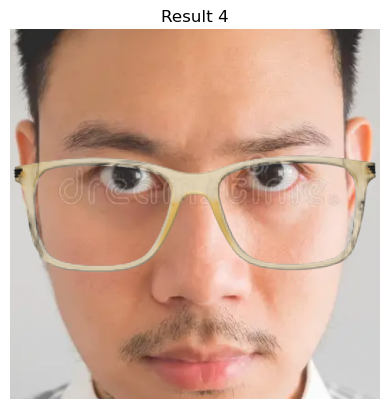

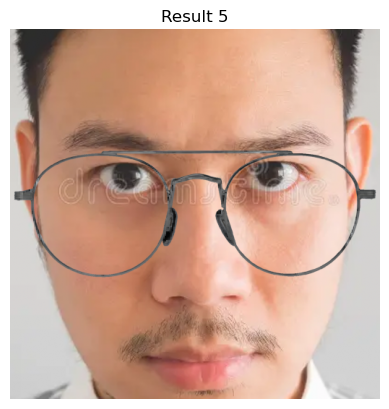

In [33]:
def vit_harmonization(glasses, mask, face, patch_size=4):
    """Vision Transformer-inspired harmonization - simplified"""
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    # Patch-based processing
    h, w = glasses.shape[:2]
    
    result = face.copy()
    
    for i in range(0, h-patch_size, patch_size//2):
        for j in range(0, w-patch_size, patch_size//2):
            # Extract patches
            face_patch = face[i:i+patch_size, j:j+patch_size]
            glasses_patch = glasses[i:i+patch_size, j:j+patch_size]
            mask_patch = mask[i:i+patch_size, j:j+patch_size]
            
            if np.mean(mask_patch) > 0.1:
                # Attention-like blending
                similarity = np.corrcoef(face_patch.flatten(), glasses_patch.flatten())[0, 1]
                if np.isnan(similarity):
                    similarity = 0.5
                
                attention_weight = (similarity + 1) / 2
                
                # Apply attention
                mask_patch_3d = np.stack([mask_patch]*3, axis=2)
                blended_patch = (face_patch * (1 - mask_patch_3d) + 
                               glasses_patch * mask_patch_3d * attention_weight)
                
                result[i:i+patch_size, j:j+patch_size] = blended_patch
    
    result = np.clip(result, 0, 1)
    return result

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = vit_harmonization(glasses, mask, bg_img, patch_size=4) # smaller patch size means more accurate details but longer computation
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

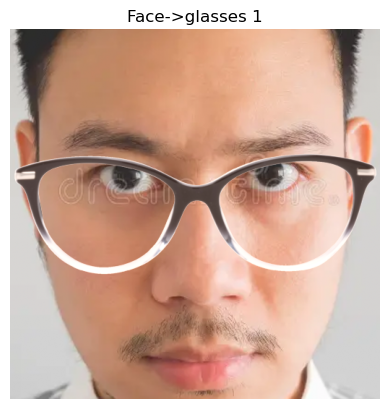

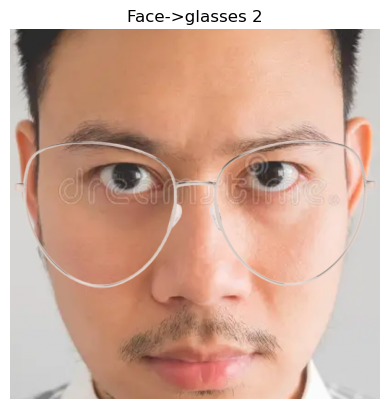

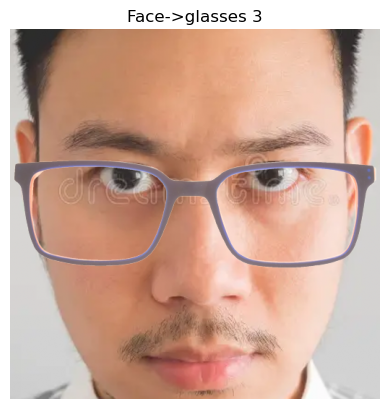

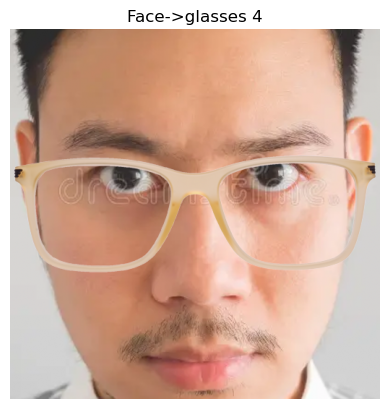

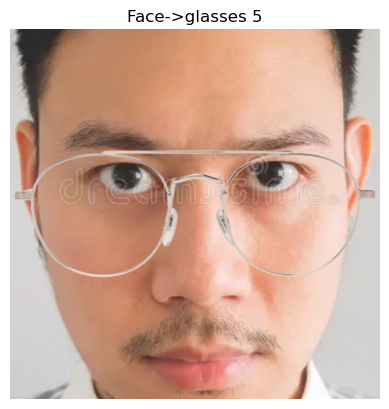

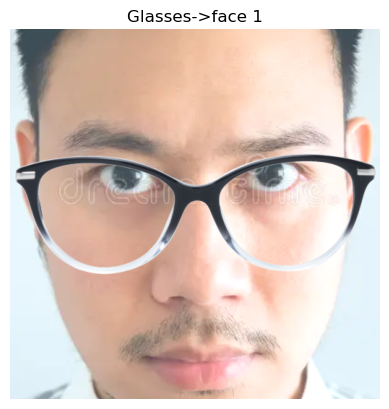

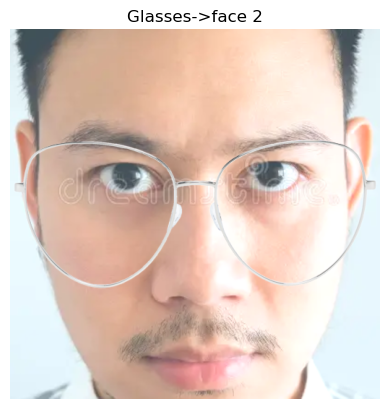

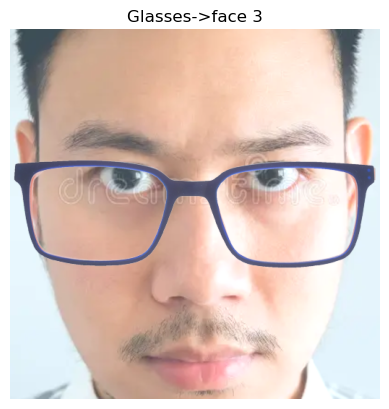

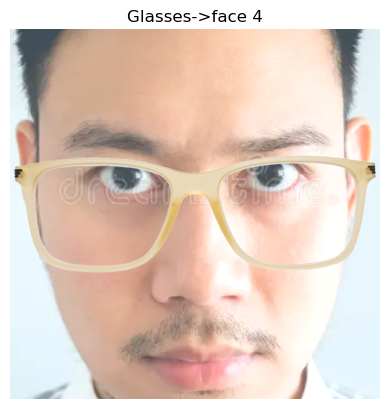

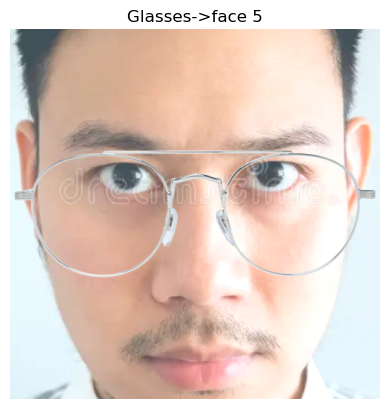

In [38]:
def diffusion_like_harmonization(glasses, mask, face, num_steps = 20, inverted=False):
    """
    Diffusion-inspired harmonization using denoising-like iterative refinement
    Simulates denoising process from diffusion model for harmonization
    """
    if inverted:
        mask = 1 - mask
        glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    mask_3d = np.stack([mask]*3, axis=2)
    current = face * (1 - mask_3d) + glasses * mask_3d
    
    # Iterative denoising
    for step in range(num_steps):
        denoised = cv2.GaussianBlur(current, (3, 3), 0)
        score = current - denoised
        step_size = 0.1 * (1 - step / num_steps)
        current = current - step_size * score * mask_3d
        
        # Color consistency step
        for c in range(3):
            bg_mean = np.mean(face[:, :, c])
            fg_mean = np.mean(current[:, :, c][mask > 0.5])
            
            if fg_mean > 0:
                color_adjust = (bg_mean - fg_mean) * 0.1
                current[:, :, c] = current[:, :, c] + color_adjust * mask
        
        current = np.clip(current, 0, 1)
    
    return current

# higher num_steps means more otne optimisatino to alignt with the rest of the picture
for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = diffusion_like_harmonization(glasses, mask, bg_img, 5)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = diffusion_like_harmonization(glasses, mask, bg_img, 5, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face {i+1}")
plt.show()

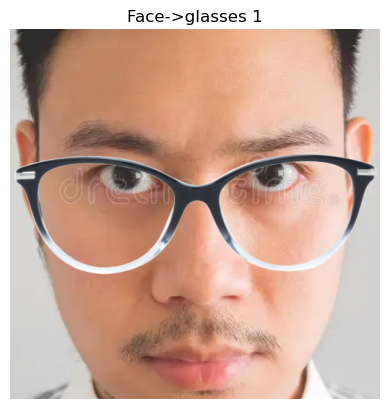

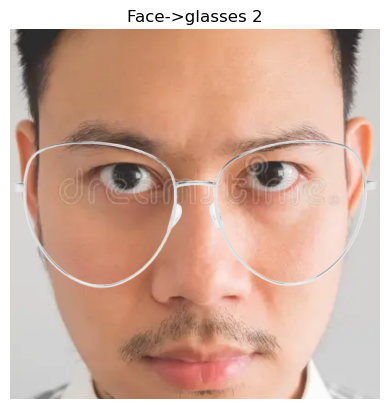

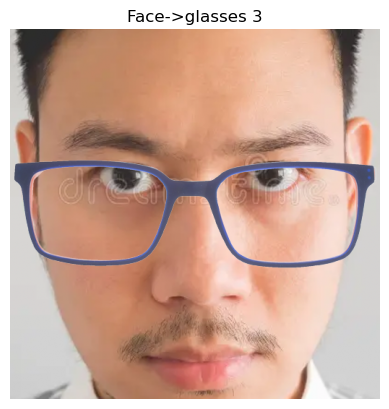

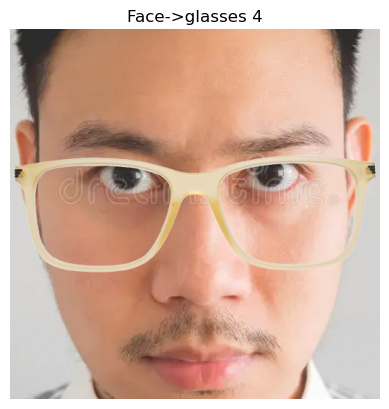

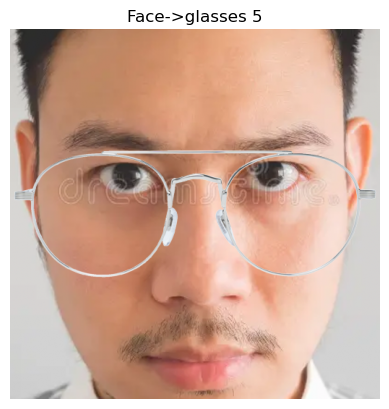

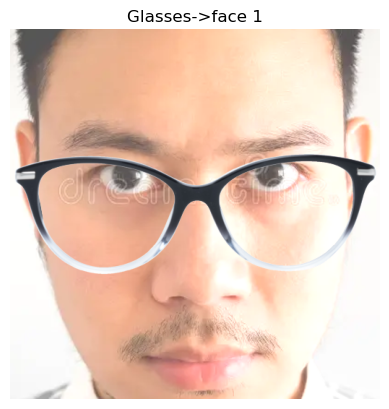

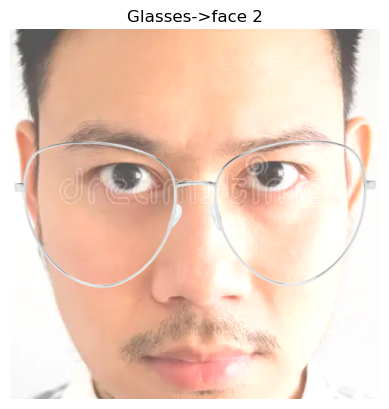

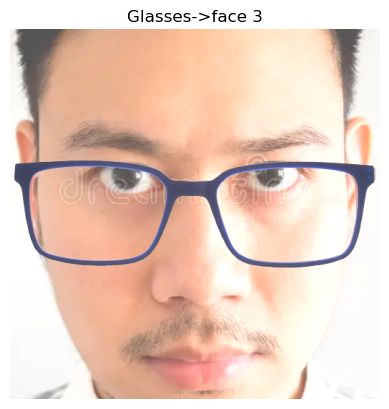

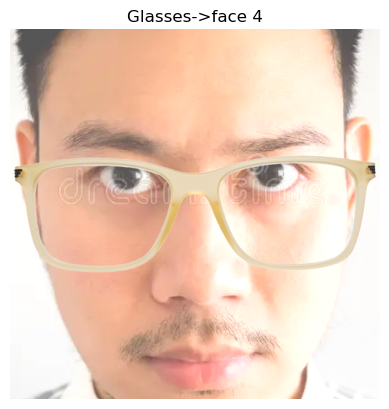

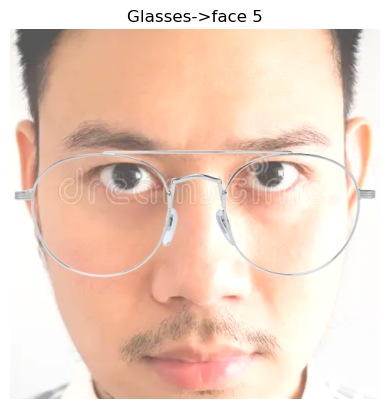

In [42]:
def neural_style_transfer_harmonization(glasses, mask, face, inverted=False):
    """
    Neural Style Transfer-inspired harmonization
    Simulates NST using texture synthesis and style matching
    """
    
    # Gram matrix computation (style representation)
    def gram_matrix(features):
        h, w, c = features.shape
        features_flat = features.reshape(-1, c)
        gram = np.dot(features_flat.T, features_flat) / (h * w)
        return gram
    
    # Extract features at multiple scales
    def extract_features(image, scales=[1, 2, 4]):
        features = []
        for scale in scales:
            kernel_size = max(3, scale * 2 + 1)
            blurred = gaussian_blur(image, kernel_size)
            features.append(blurred)
        return features
    
    def gaussian_blur(image, kernel_size=5):
        """Apply Gaussian blur"""
        return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    
    if inverted:
        mask = 1 - mask
        glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    # Get style features from face
    face_features = extract_features(face)
    face_grams = [gram_matrix(feat) for feat in face_features]
    
    # Initialize with composite
    mask_3d = np.stack([mask]*3, axis=2)
    current = face * (1 - mask_3d) + glasses * mask_3d
    
    # Optimize for style transfer
    for _ in range(15):
        current_features = extract_features(current)
        
        # Compute style loss gradient (approximated)
        style_grad = np.zeros_like(current)
        
        for i, (curr_feat, face_gram) in enumerate(zip(current_features, face_grams)):
            curr_gram = gram_matrix(curr_feat)
            
            # Approximate gradient
            diff = curr_gram - face_gram
            grad_approx = np.mean(diff) * 0.1
            
            # Apply gradient in masked region
            style_grad += grad_approx * mask_3d
        
        # Update
        current = current - style_grad * 0.1
        
        # Content preservation
        content_loss = mask_3d * (current - glasses) ** 2
        current = current - content_loss * 0.05
        
        current = np.clip(current, 0, 1)

    return current

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = neural_style_transfer_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Face->glasses {i+1}")
plt.show()

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = neural_style_transfer_harmonization(glasses, mask, bg_img, inverted=True)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Glasses->face {i+1}")
plt.show()

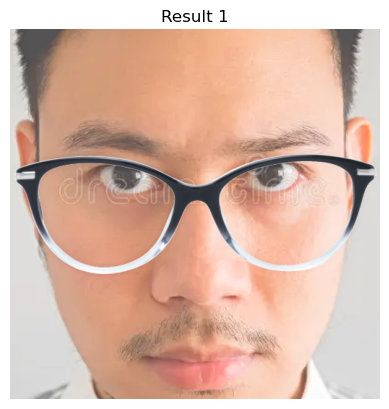

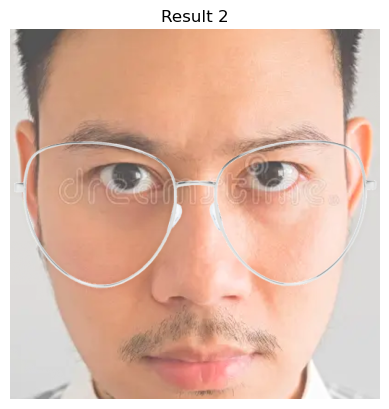

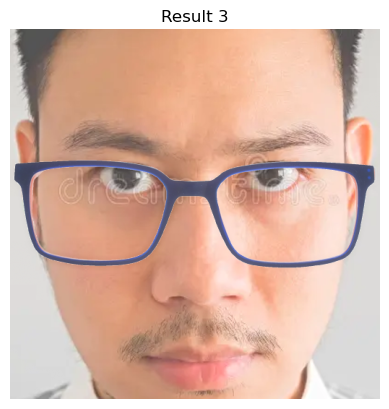

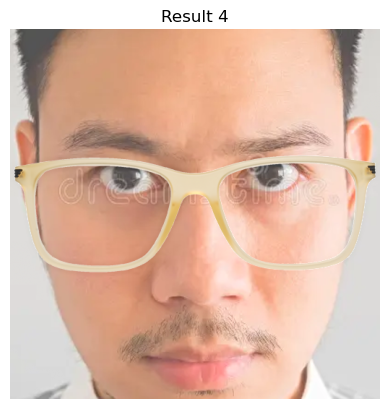

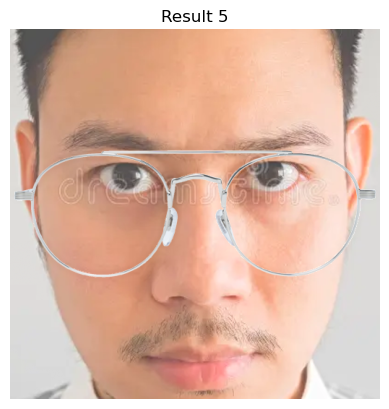

In [51]:
def gan_like_optimization(glasses, mask, face, depth=2):
    """
    GAN-inspired harmonization using adversarial-like refinement
    Simulates generator-discriminator optimization through iterative refinement
    """
    
    # invert because we will train segmentation model
    mask = 1 - mask
    glasses, face = face, glasses
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    mask_3d = np.stack([mask]*3, axis=2)
    current = face * (1 - mask_3d) + glasses * mask_3d
    
    # Iterative refinement
    for _ in range(depth):
        
        # Generator step: improve harmonization
        face_gray = cv2.cvtColor((face * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        current_gray = cv2.cvtColor((current * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        
        # Compute local statistics
        face_mean = cv2.blur(face_gray, (15, 15))
        current_mean = cv2.blur(current_gray, (15, 15))
        
        # Adjust based on local statistics
        adjustment = (face_mean - current_mean) / 255.0
        adjustment_3d = np.stack([adjustment]*3, axis=2)
        current = current + adjustment_3d * mask_3d * 0.1
        
        # Discriminator step: edge consistency
        face_edges = cv2.Canny((face * 255).astype(np.uint8), 50, 150)
        current_edges = cv2.Canny((current * 255).astype(np.uint8), 50, 150)
        
        edge_diff = (face_edges - current_edges) / 255.0
        edge_diff_3d = np.stack([edge_diff]*3, axis=2)
        current = current + edge_diff_3d * mask_3d * 0.05
        
        current = np.clip(current, 0, 1)
    
    return current

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = gan_like_optimization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()


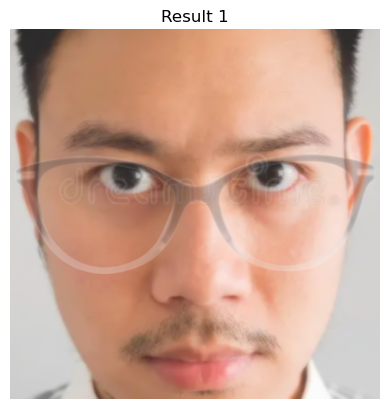

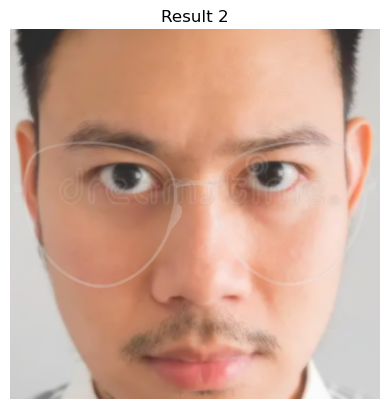

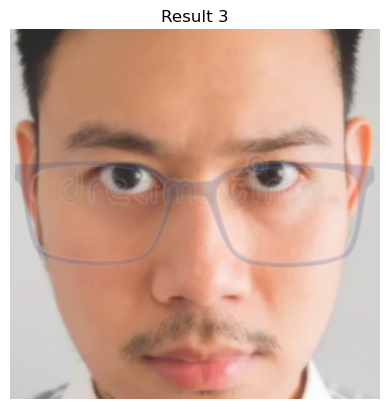

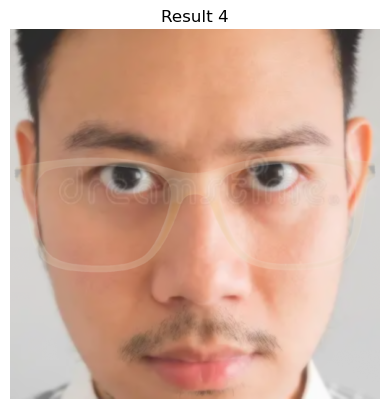

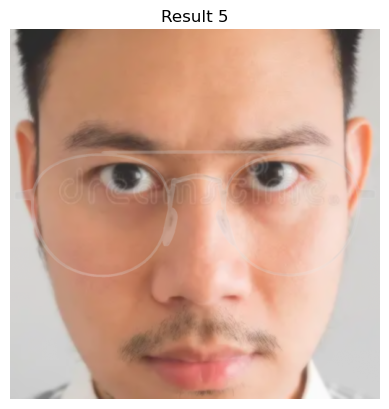

In [52]:
def cnn_inspired_harmonization(glasses, mask, face):
    """
    CNN-inspired harmonization using multi-scale feature extraction and blending
    Extracts and matches CNN features
    """
    def extract_features(image, scales=[1, 2, 4, 8]):
        features = []
        for scale in scales:
            kernel_size = max(3, scale * 2 + 1)
            blurred = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
            features.append(blurred)
        return features
    
    glasses = glasses / 255.0
    face = face / 255.0
    
    # Extract features from both images
    glasses_features = extract_features(glasses)
    face_features = extract_features(face)
    
    # Hierarchical feature blending
    harmonized = face.copy()
    mask_3d = np.stack([mask]*3, axis=2)
    
    for i, (g_feat, f_feat) in enumerate(zip(glasses_features, face_features)):
        weight = 0.8 / (i + 1)
        blended_feat = f_feat * (1 - mask_3d * weight) + g_feat * mask_3d * weight
        harmonized = harmonized * 0.7 + blended_feat * 0.3
    
    return np.clip(harmonized, 0, 1)

# Usage
for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cnn_inspired_harmonization(glasses, mask, bg_img)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()

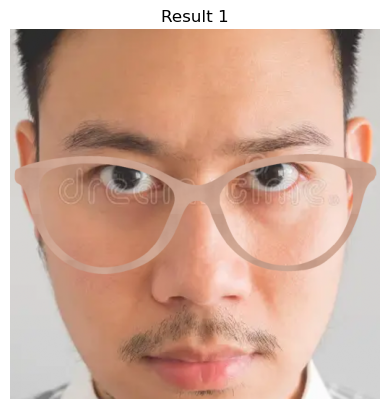

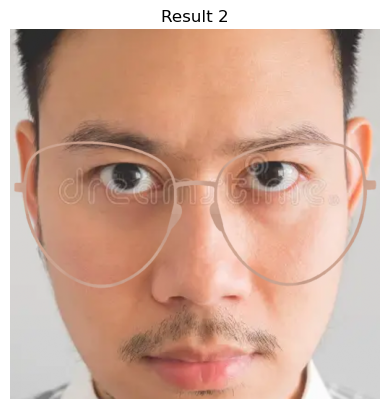

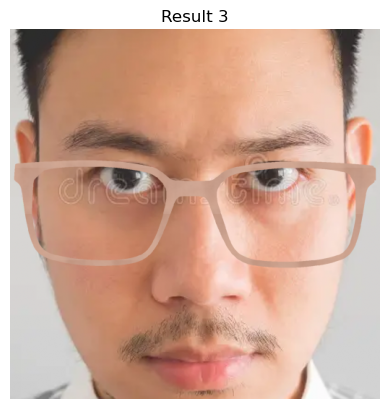

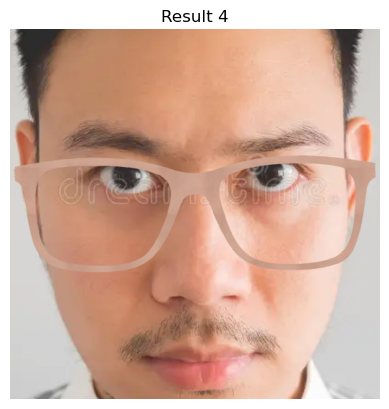

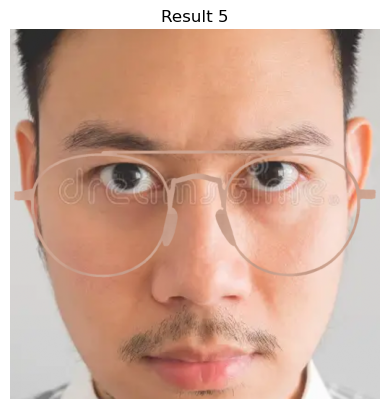

In [45]:
import numpy as np

def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

def cross_attention_harmonization(glasses, mask, face, patch_size=16):
    glasses = glasses / 255.0
    face = face / 255.0
    h, w, c = glasses.shape

    # Patchify
    def patchify(image):
        patches = []
        channels = 1 if image.ndim == 2 else c
        for i in range(0, h, patch_size):
            for j in range(0, w, patch_size):
                patch = image[i:i+patch_size, j:j+patch_size]
                patch = patch.reshape(-1, channels)
                patches.append(patch)
        return patches

    def unpatchify(patches):
        channels = patches[0].shape[1]
        if channels == 1:
            result = np.zeros((h, w))
            idx = 0
            for i in range(0, h, patch_size):
                for j in range(0, w, patch_size):
                    result[i:i+patch_size, j:j+patch_size] = patches[idx].reshape(patch_size, patch_size)
                    idx += 1
        else:
            result = np.zeros((h, w, c))
            idx = 0
            for i in range(0, h, patch_size):
                for j in range(0, w, patch_size):
                    result[i:i+patch_size, j:j+patch_size, :] = patches[idx].reshape(patch_size, patch_size, c)
                    idx += 1
        return result

    glasses_patches = patchify(glasses)
    face_patches = patchify(face)
    mask_patches = patchify(mask)

    face_matrix = np.stack([p.flatten() for p in face_patches])
    harmonized_patches = []

    for g_patch, f_patch, m_patch in zip(glasses_patches, face_patches, mask_patches):
        g_vec = g_patch.flatten()
        # attention score: cosine similarity with all face patches
        scores = face_matrix @ g_vec
        scores = scores / (np.linalg.norm(face_matrix, axis=1) * np.linalg.norm(g_vec) + 1e-8)
        attn_weights = softmax(scores)

        # weighted sum of face patches
        harmonized_vec = sum(w * f.flatten() for w, f in zip(attn_weights, face_patches))
        harmonized_patch = harmonized_vec.reshape(g_patch.shape)

        # blend with mask
        if m_patch.shape[1] == 1:
            m_patch_3d = np.repeat(m_patch, 3, axis=1)
        else:
            m_patch_3d = m_patch
        harmonized_patch = f_patch * (1 - m_patch_3d) + harmonized_patch * m_patch_3d

        harmonized_patches.append(harmonized_patch)

    result = unpatchify(harmonized_patches)
    return np.clip(result, 0, 1)

for i, (glasses, mask) in enumerate(glasses_with_masks):
    result = cross_attention_harmonization(glasses, mask, bg_img, 64)
    plt.figure()
    plt.imshow(result)
    plt.axis("off")
    plt.title(f"Result {i+1}")
plt.show()